<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Dados de imagem de Satelite <br><br><br>Analise usando Numpy</p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>Fonte: Imagem de Satelite by: Projeto WIFIRE </p>


WIFIRE é um sistema integrado para análise de incêndios florestais, com foco específico nas mudanças na dinâmica urbana e no clima. O sistema integra observações em rede, como dados heterogêneos de satélite e dados de sensores remotos em tempo real, com técnicas computacionais de processamento de sinais, visualização, modelagem e assimilação de dados. Isso permite um método escalável para monitorar fenômenos como padrões climáticos, ajudando a prever a taxa de propagação de um incêndio florestal. Você pode saber mais sobre o WIFIRE em: https://wifire.ucsd.edu/.

Neste exemplo, analisaremos um conjunto de dados de imagens de satélite do WIFIRE usando a biblioteca NumPy.

In [141]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import matplotlib.image as mpimg
import random

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Criando um array numpy a partir de um arquivo de imagem:</p> 

<br>
Vamos escolher um arquivo de imagem de satélite do WIFIRE como um ndarray e exibir seu tipo

In [144]:
from skimage import data

photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg") #Lê a imagem  e transforma em um array 3D 'Tridimensional'
print(type(photo_data)) #mostrnado o tipo da variavel photo_data, <class 'numpy.ndarray'> 
#photo_data.shape #(3725, 4797, 3) 3725 Linhas, 4797 colunas e 3 camadas. 

<class 'numpy.ndarray'>


Vamos ver a imagem!

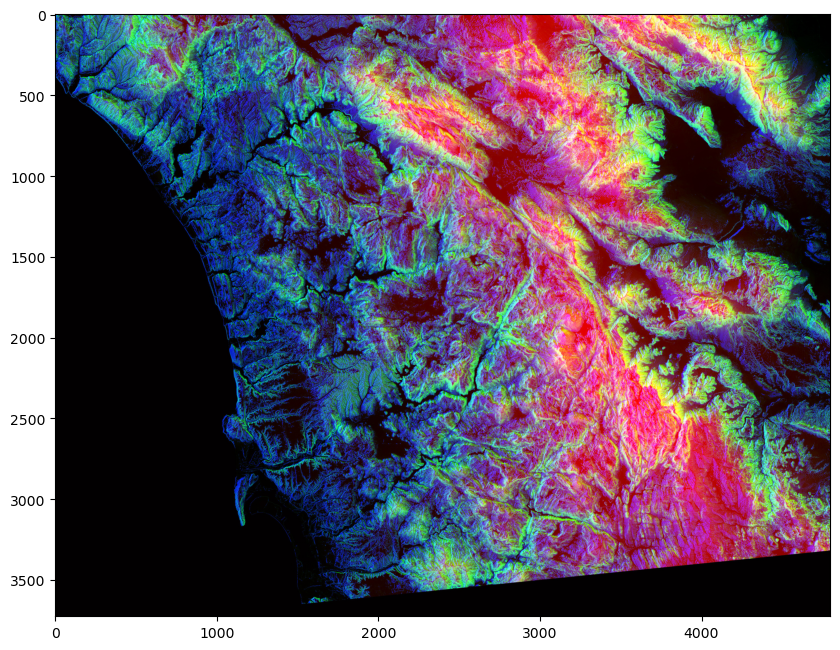

In [20]:
plt.figure(figsize=(10,10))
plt.imshow(photo_data) # Lê o valor do array e tranforma de novo em imagen.
plt.show()

In [21]:
photo_data.shape

(3725, 4797, 3)


O formato do ndarray mostra que se trata de uma matriz com três camadas. Os dois primeiros números representam o comprimento e a largura, enquanto o terceiro número (3) corresponde às três camadas: Vermelho, Verde e Azul.
<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"> Mapeamento de Cores RGB na Foto:</p> <br> <ul> <li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold"> O pixel **VERMELHO** indica a **Altitude**</p></li> <li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold"> O pixel **AZUL** indica o **Aspecto**</p></li> <li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold"> O pixel **VERDE** indica a **Inclinação**</p></li> </ul> <br>

Os valores mais altos representam maiores valores de altitude, aspecto e inclinação.

In [23]:
photo_data.size

53606475

In [24]:
photo_data.min()
photo_data.max()

255

In [26]:
photo_data.mean()

75.8299354508947

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th Row and 250th Column</p>

In [28]:
photo_data[150,250]

array([ 17,  35, 255], dtype=uint8)

In [29]:
photo_data[150,250,1]

35

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br> Definir um Pixel com Todos os Valores Zerados</p> <br/> Podemos definir todas as três camadas de um pixel de uma vez, atribuindo o valor **zero** globalmente para esse par (**linha, coluna**). No entanto, definir um único pixel como zero não é perceptível.

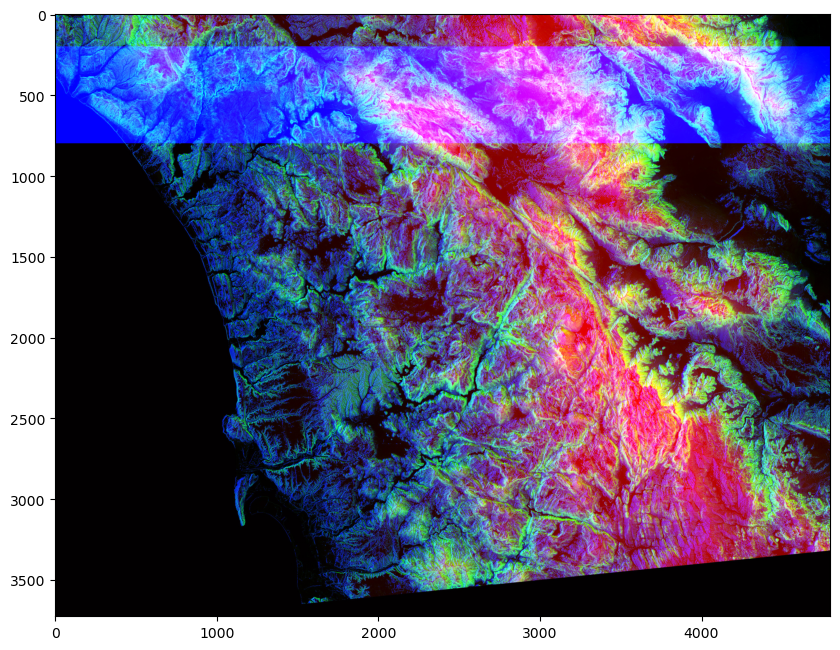

In [31]:
#photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[200:800, : ,2] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br> Alterando Cores em um Intervalo</p> <br/> Também podemos usar um intervalo para alterar os valores dos pixels. Como exemplo, vamos definir a camada **verde** para as linhas de **200 a 800** com **intensidade máxima**.

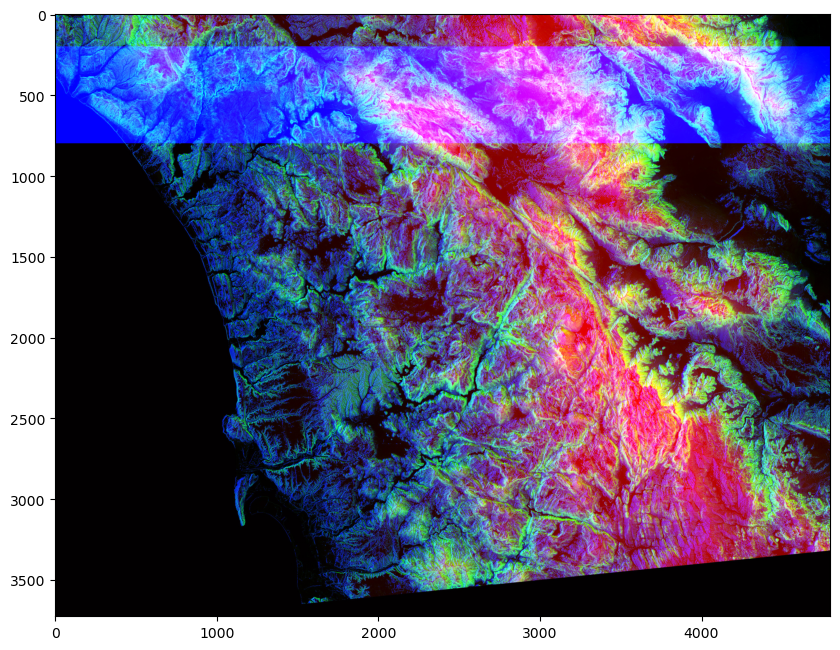

In [146]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")

photo_data[200:800, : ,2] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

C:\Users\mathe\AppData\Local\Temp\ipykernel_22240\63931971.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")


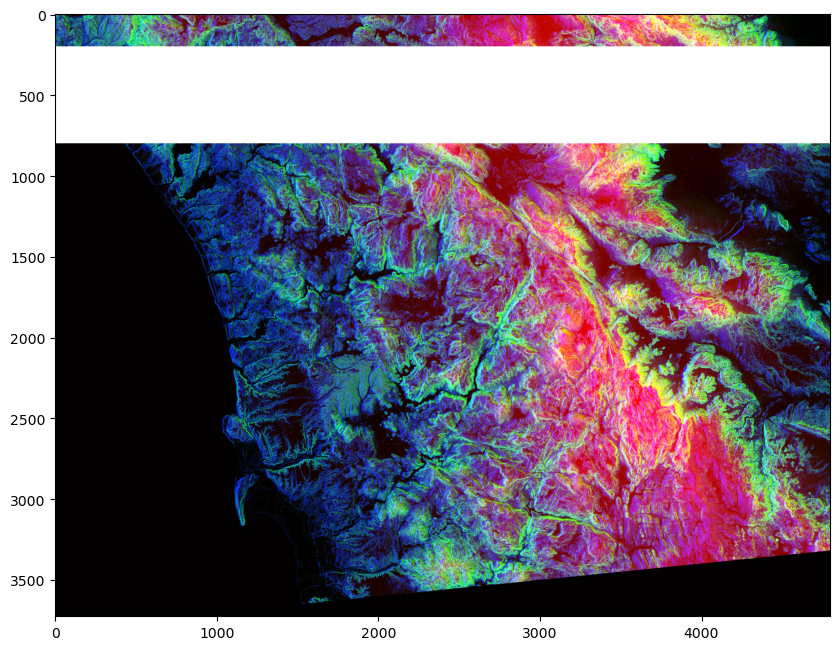

In [34]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")

photo_data[200:800, : ] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

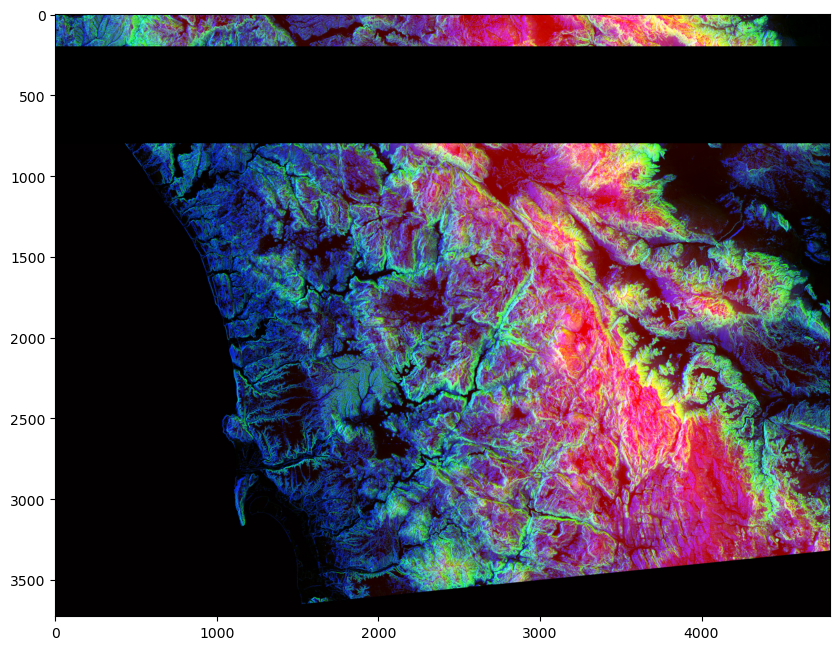

In [148]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")

photo_data[200:800, : ] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pegue todos os pixels com valores baixos</p>

In [151]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
print("shape of photo_data: ", photo_data.shape)
low_value_filter = photo_data < 200
print("shape of low_value_filter: ", low_value_filter.shape)

shape of photo_data:  (3725, 4797, 3)
shape of low_value_filter:  (3725, 4797, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtrando saída com valores baixos</p><br/>
Sempre que low_value_filter é true, set valor para 0

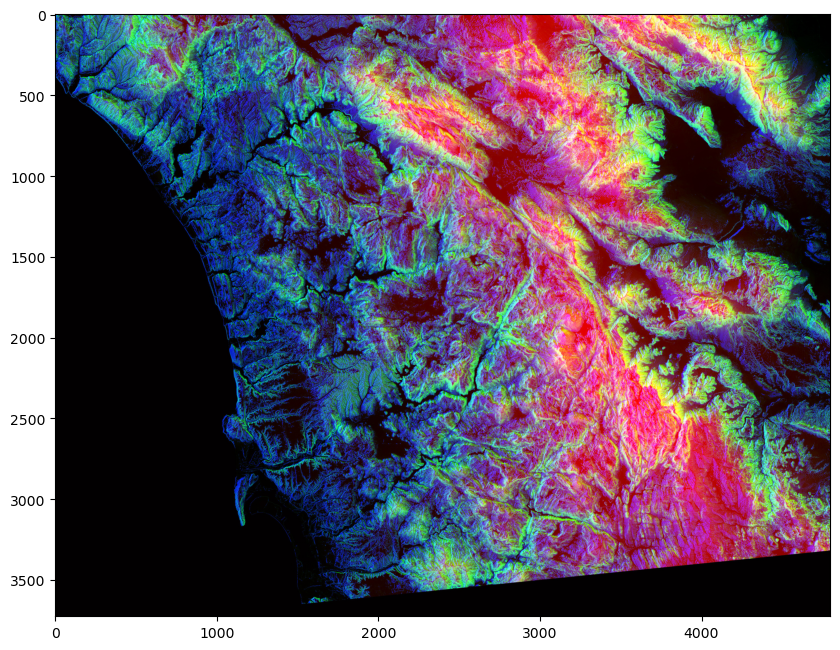

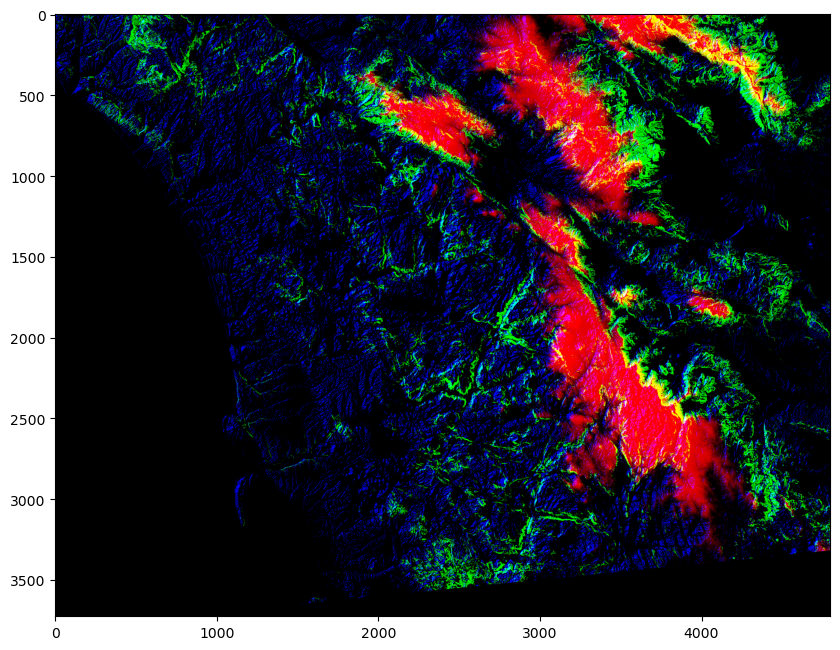

In [154]:
# import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Mais operações de linhas e colunas</p><br>
Você pode criar padrões complexos fazendo as colunas dependerem das linhas ou vice-versa. Aqui, tentamos uma relação linear entre linhas e colunas.

In [157]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [159]:
photo_data[rows_range, cols_range] = 255

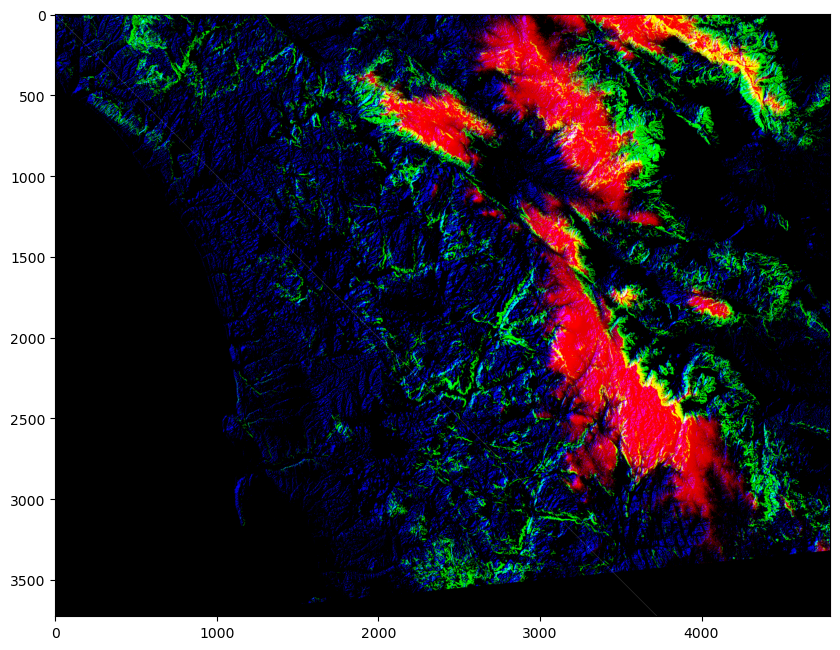

In [161]:
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Agora vamos tentar algo ainda mais incrível... uma máscara em forma de um disco circular..

[[10 20 30]
 [40 50 60]
 [70 80 90]]


In [265]:
total_rows, total_cols, total_layers = photo_data.shape
print("photo_data : ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
print("X = ", X.shape, " and Y = ", Y.shape)

#3725 Linhas, 4797 colunas com 3 dimensões.

photo_data :  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


In [309]:
X[3722:, 0]

array([3722, 3723, 3724])

In [319]:
Y[0, -3:]

array([4794, 4795, 4796])

In [347]:
center_row, center_col = total_rows / 2, total_cols / 2 # Criando variaveis para definir o centro. 
print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row) # Mostrando array x Horizontal
#print(Y - center_col) # Mostando array y Vertical
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

center_row =  1862.5 AND center_col =  2398.5
[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]
Radius =  3468906.25
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False

In [333]:
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print(dist_from_center.shape)

(3725, 4797)


In [341]:
dist_from_center[1862, 2398]

0.5

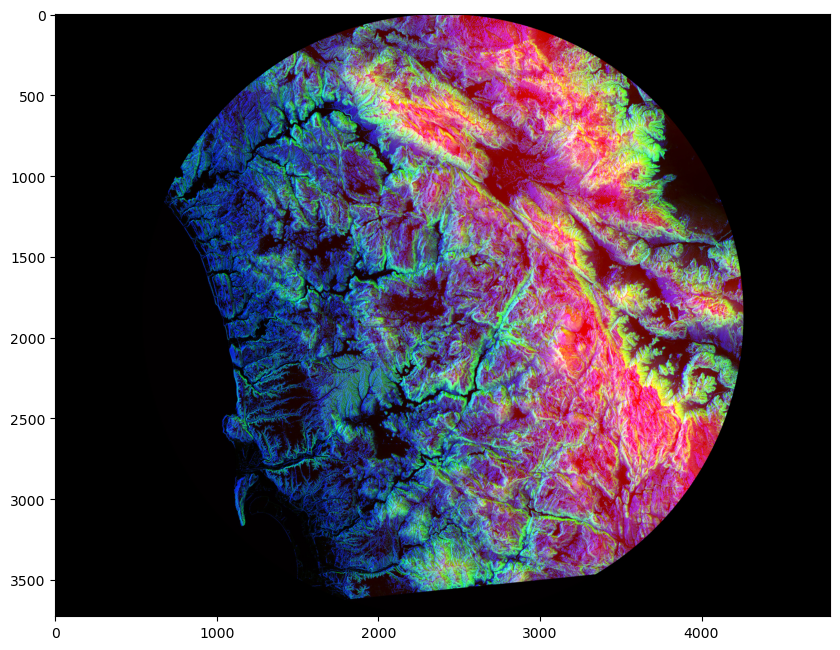

In [349]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
photo_data[circular_mask] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()

In [170]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

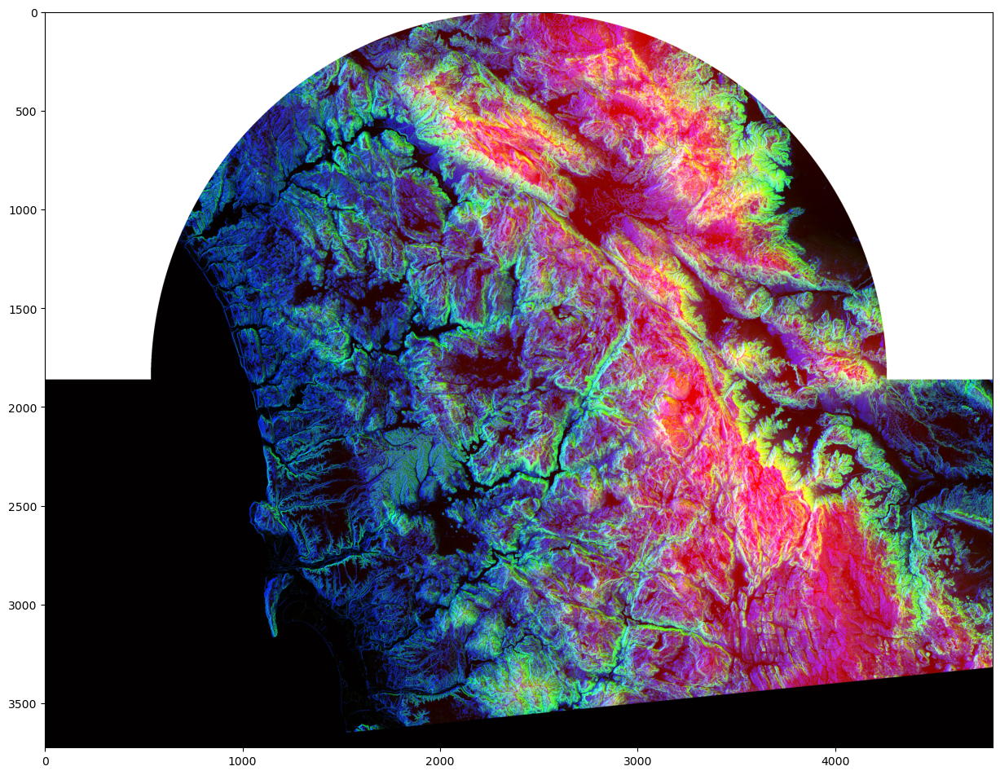

In [171]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
photo_data[half_upper_mask] = 255
#photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()

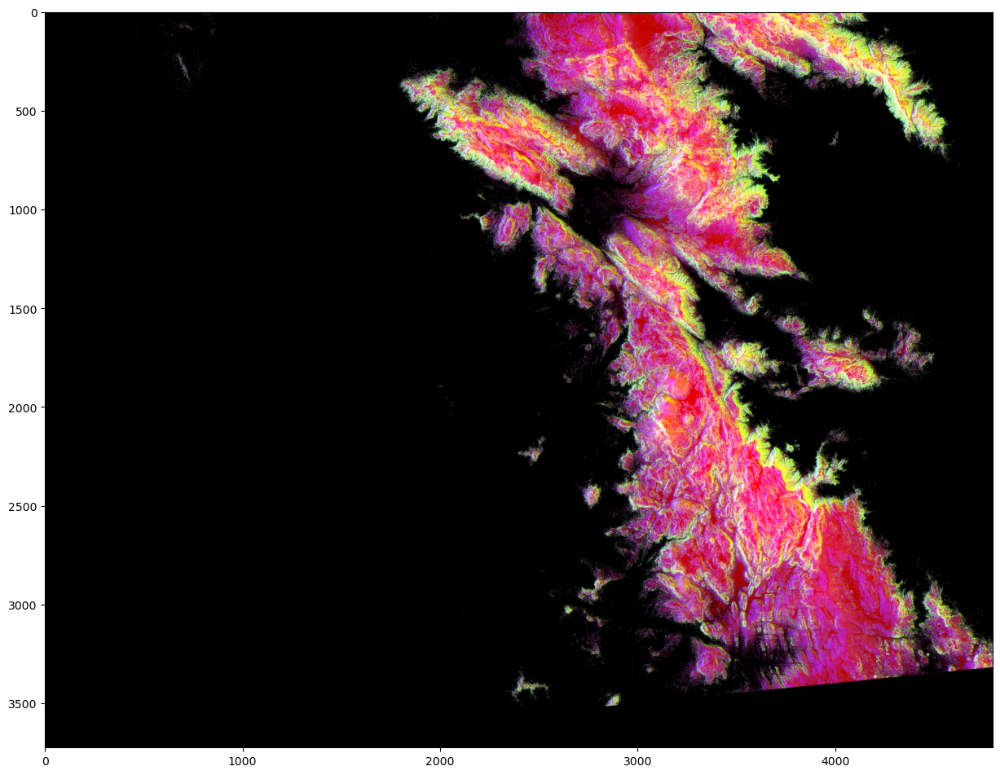

In [172]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
red_mask = photo_data[:, :, 0] < 150 #Red_mask recebe o array, pegue todas as linhas e todas as colunas e selecione o que for menor que 150

photo_data[red_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()

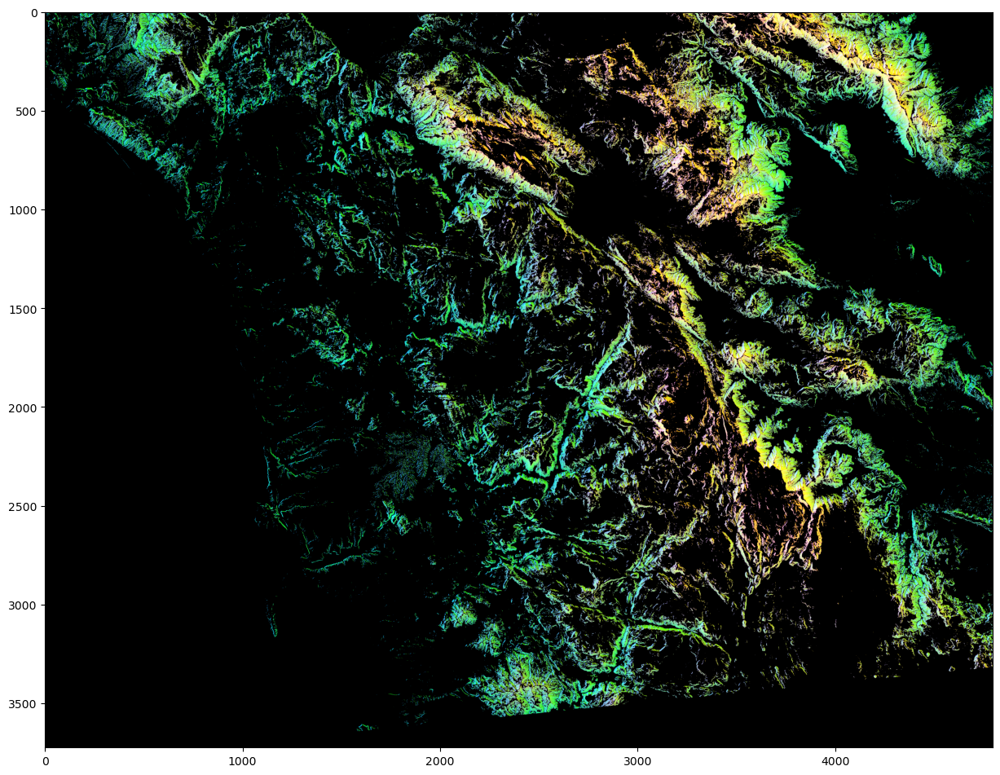

In [173]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
red_mask = photo_data[:, :, 1] < 150

photo_data[red_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()

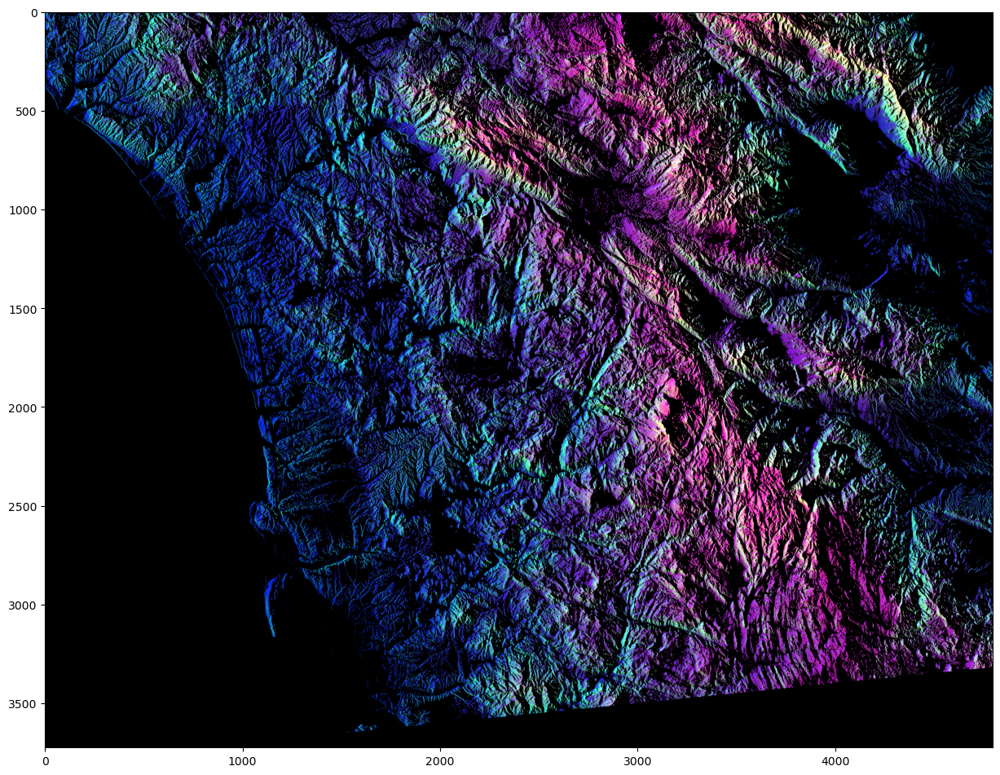

In [174]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")
red_mask = photo_data[:, :, 2] < 150 
photo_data[red_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
plt.show()

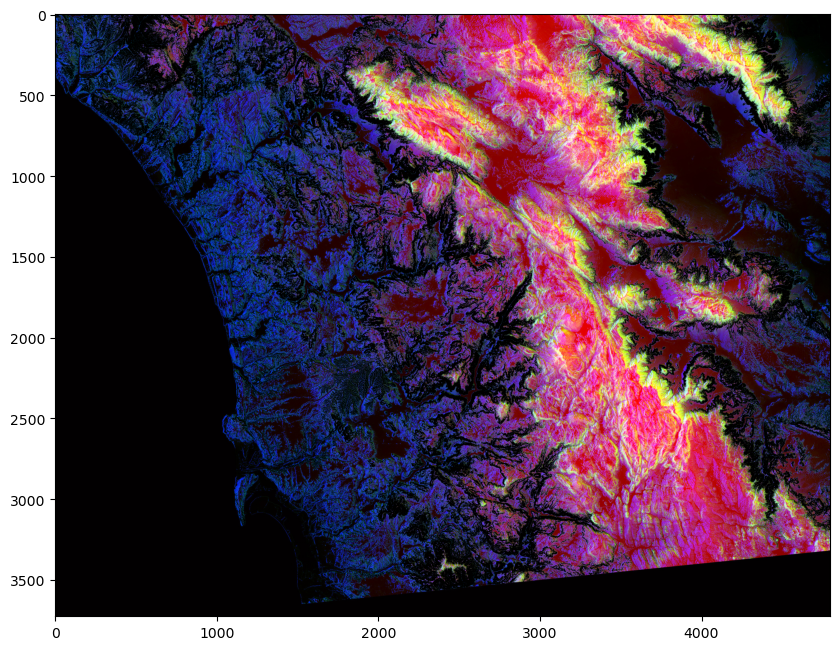

In [177]:
photo_data = imageio.imread(r"C:\Users\mathe\OneDrive\Área de Trabalho\wifire\sd-3layers.jpg")

red_mask = photo_data[:,:,0] < 150
green_mask = photo_data[:,:,1] > 100
blue_mask = photo_data[:, :, 2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0 
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
plt.show()